In [1]:
import numpy as np
import matplotlib.pyplot as plt
import _pickle as pkl
import pandas as pd
import os,sys,glob, h5py

from dlab import generalephys as ephys
from dlab.generalephys import placeAxesOnGrid, cleanAxes
from dlab import utils
from dlab import rf_analysis
from dlab import psth_and_raster as psth
from dlab import reliability_and_precision as rp
from dlab.continuous_traces import gaussian_filter1d
from scipy.signal import find_peaks
from scipy.stats import pearsonr, spearmanr, zscore
from itertools import combinations 

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

import seaborn as sns
sns.set_style('white')
%matplotlib inline
%load_ext autoreload
%autoreload 2
import warnings
warnings.filterwarnings('ignore')

In [2]:
def rastor_svm(dF,df_reaches,start,end,binsize=1): #12 frames before, 32 frames after
    #START IS TIME BEFORE REACHMAX
    #END IS TIME AFTER REACHMAX -- IF BEFORE REACHMAX THEN END MUST BE NEGATIVE
    #collapses mean fr along bins
    #initialize 

    edges=np.arange(-start,end,binsize)
    num_bins=edges.shape[0] #number of bins 
    byreach=np.zeros((len(df_reaches.reachMax_mini),num_bins))
    #behavior=np.zeros((len(df_reaches.reachMax_mini),1))
    rastor = []
    rastors = []
    behavior = []
    behaviors = []


    for i,times in enumerate(dF.times): #for each unit 
        t = np.array(times) #for reach unit create an array of that unit's spike times
        for j,tmax in enumerate(df_reaches.reachMax_mini): #compare that unit's spike times to each reach max
            a = int(tmax-start)
            b = int(tmax+end)
            epochs = t[a:b] #find if that unit spiked within designated timeframes around reachmax
            rastor.append(epochs)
            #byreach[j,:] = list(epochs)
            rea = df_reaches.behaviors[j]
            if rea == 'success':
                behavior.append(1)
            else:
                behavior.append(0)

        rastors.append(rastor)
        byreach=np.zeros((len(df_reaches.reachMax_mini),num_bins))
        behaviors.append(behavior)
        behavior = []
        rastor = []
        

    return rastors,behaviors

In [3]:
def rastor(dF,df_reaches,start,end,binsize=1): #12 frames before, 32 frames after
    #START IS TIME BEFORE REACHMAX
    #END IS TIME AFTER REACHMAX -- IF BEFORE REACHMAX THEN END MUST BE NEGATIVE
    #collapses mean fr along bins
    #initialize 

    edges=np.arange(-start,end,binsize)
    num_bins=edges.shape[0] #number of bins 
    byreach=np.zeros((len(df_reaches.reachMax_mini),num_bins))
    #behavior=np.zeros((len(df_reaches.reachMax_mini),1))
    rastors = []
    behavior = []
    behaviors = []


    for i,times in enumerate(dF.times): #for each unit 
        t = np.array(times) #for reach unit create an array of that unit's spike times
        for j,tmax in enumerate(df_reaches.reachMax_mini): #compare that unit's spike times to each reach max
            a = int(tmax-start)
            b = int(tmax+end)
            epochs = t[a:b] #find if that unit spiked within designated timeframes around reachmax
            byreach[j,:] = epochs

        rastors.append(byreach)
        byreach=np.zeros((len(df_reaches.reachMax_mini),num_bins))
        

    return rastors

In [ ]:
for j in df.mouse.unique():
    df_ = df[df.mouse==j]
    dfr = df_reaches[df_reaches.mouse==j]
    
    rastors_f, = rastor(df_,dfr[dfr.behaviors!='success'],start,end)
    rastors_s = rastor(df,dfr[dfr.behaviors=='success'],start,end)    
    
    


In [4]:
data_path = '/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/xiaoyu/day10/df_align_all.json'
df = pd.read_json(data_path)

In [5]:
reach_path = '/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10/df_reaches_all_d10.csv'
df_reaches = pd.read_csv(reach_path)

In [6]:
df = df[df.stim!='control session 2']
df = df[df.stim!='stim']


In [7]:
start = 3*30
end = 8*30
binsize = 1

In [8]:
df.mouse.unique()

array([21, 29, 31, 32, 22, 34])

In [11]:
df_ = df
df_reaches_ = df_reaches

In [39]:
mouseid = 29

In [40]:
df = df_[df_.mouse==mouseid]
df_reaches = df_reaches_[df_reaches_.mouse==mouseid]

/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10/29
/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10/29
/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10/29
/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10/29
/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10/29
/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10/29
/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10/29
/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10/29
/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10/29
/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10/29
/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10/29
/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10/29
/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10/29
/Users/kimbe

/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10/29
/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10/29
/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10/29
/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10/29
/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10/29
/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10/29


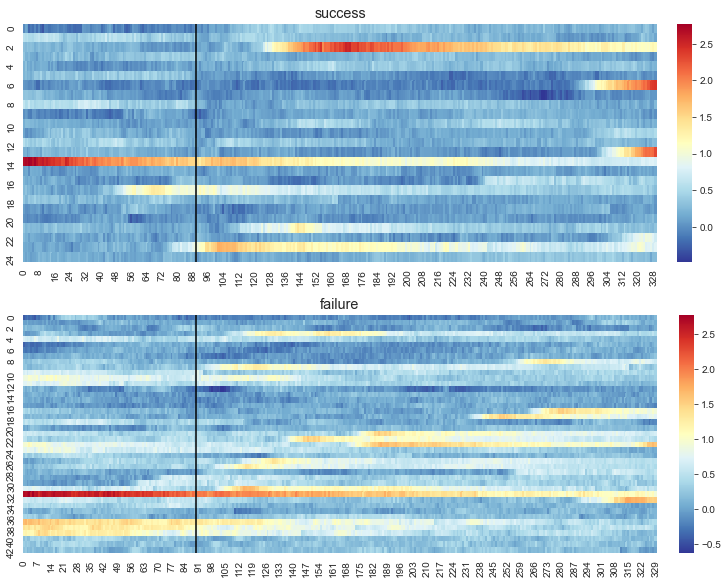

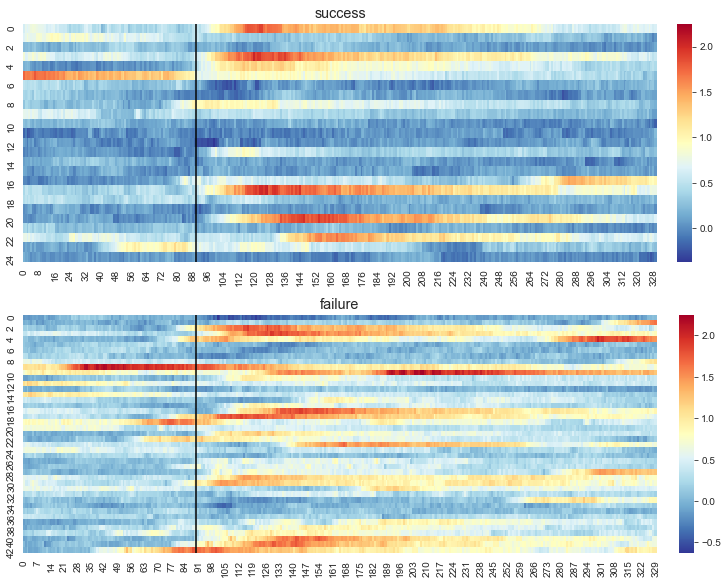

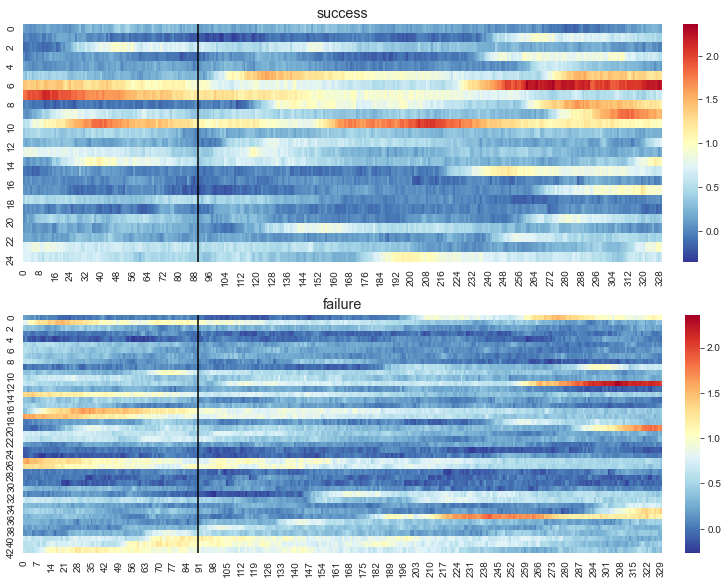

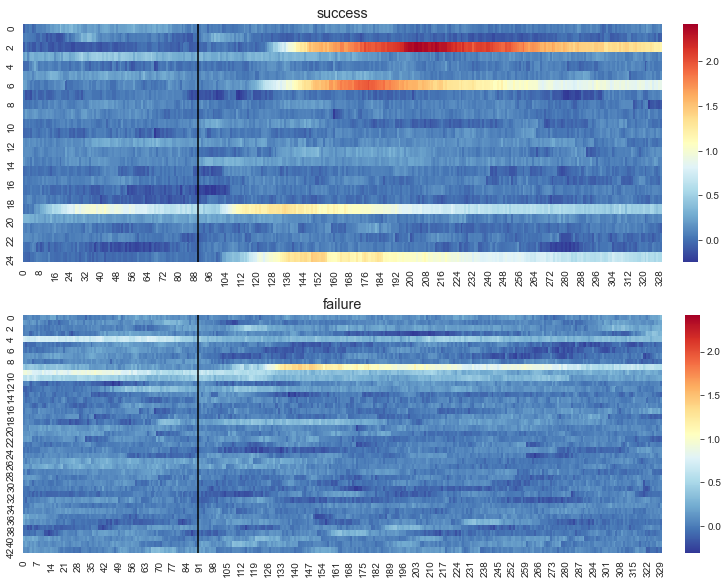

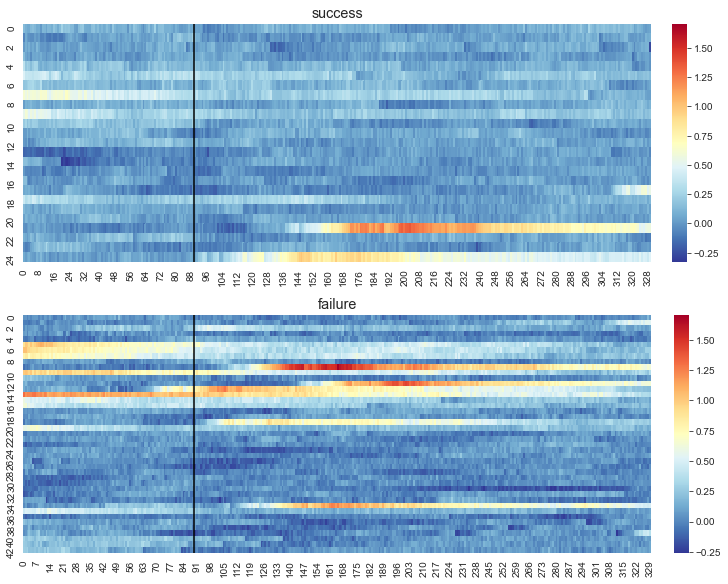

...

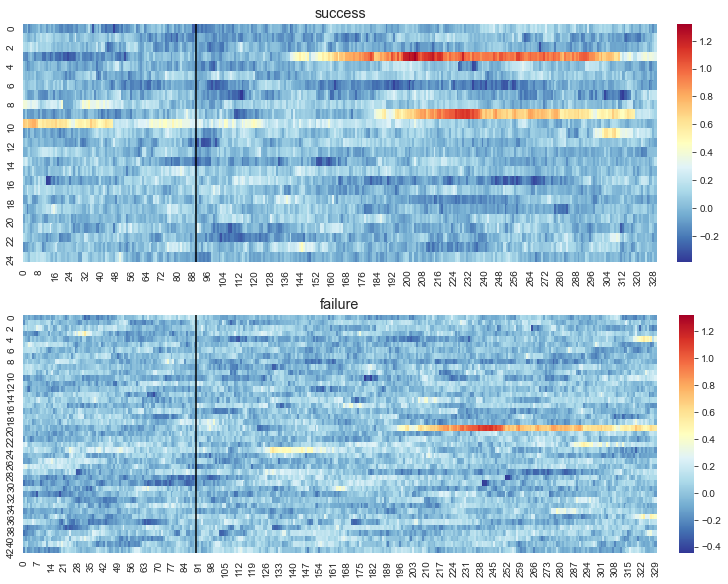

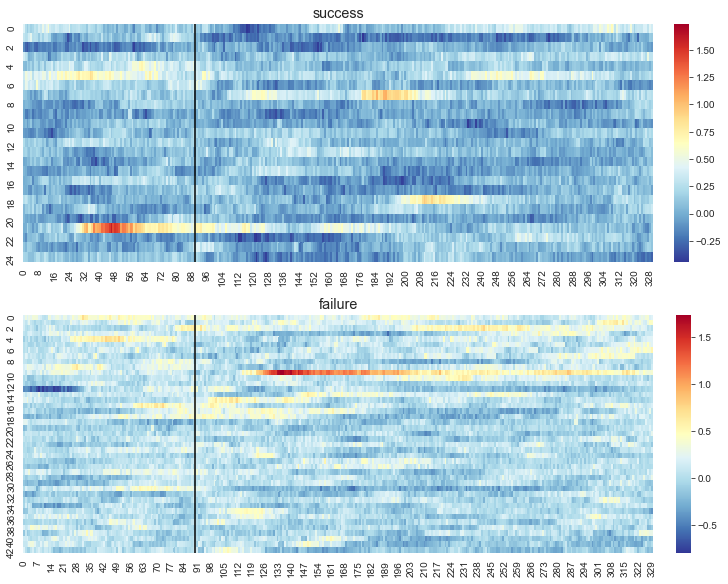

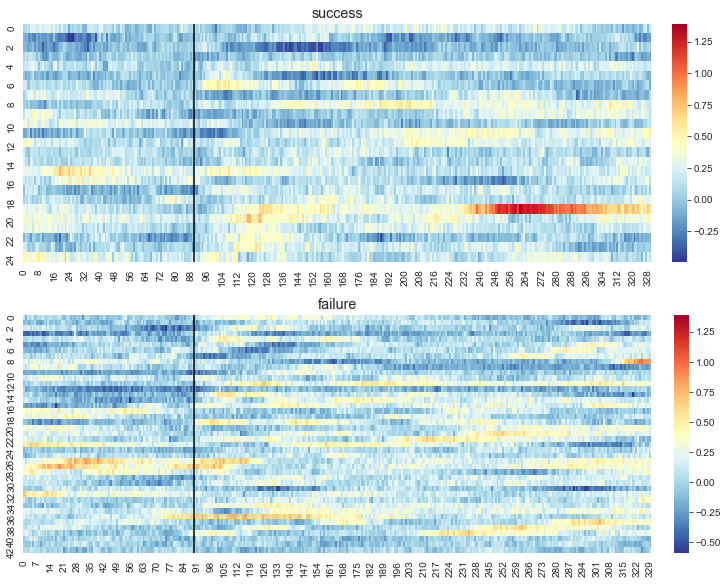

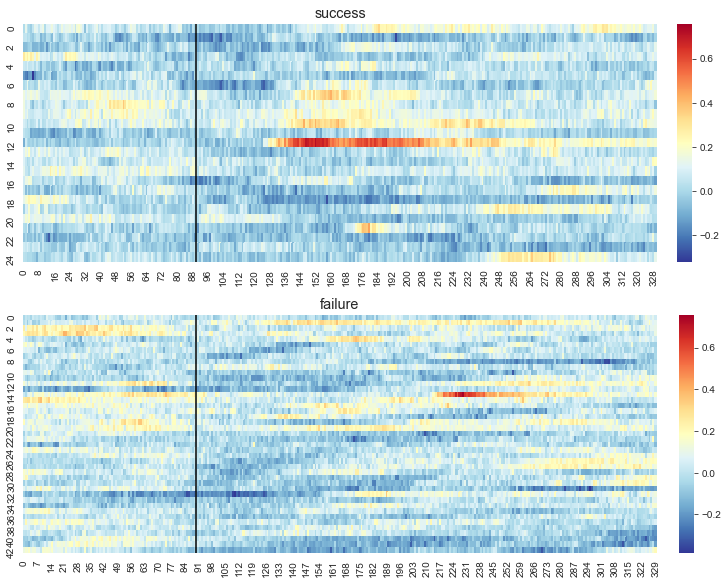

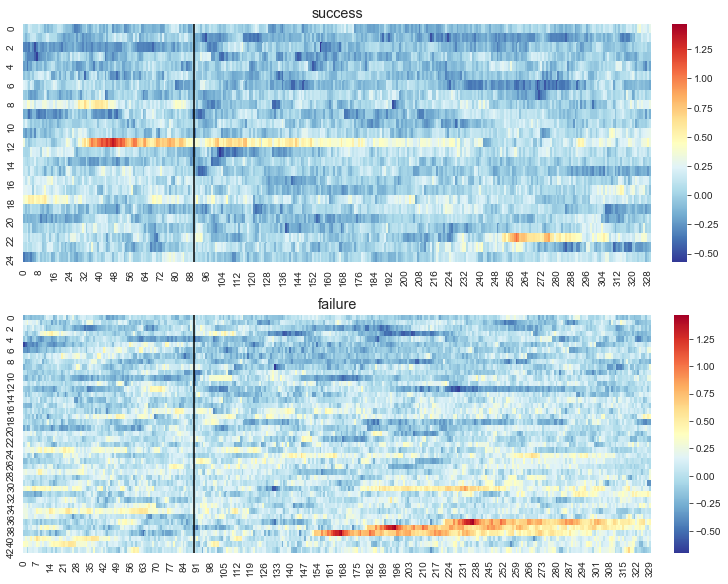

In [11]:
path = '/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10'


for j in df.mouse.unique():
    df_ = df[df.mouse==j]
    dfr = df_reaches[df_reaches.mouse==j]
    
    rastors_f = rastor(df_,dfr[dfr.behaviors!='success'],start,end)
    rastors_s = rastor(df,dfr[dfr.behaviors=='success'],start,end)    
    
    
    for i,gr in enumerate(rastors_s):
        fig, (ax1,ax2) = plt.subplots(2,figsize=(10,8),constrained_layout=True)
        max1 = np.max(rastors_s[i])
        max2 = np.max(rastors_f[i])
        vmax = np.max([max1,max2])
        #fig, (ax1,ax2) = plt.subplots(2,constrained_layout=True)
        g1 = sns.heatmap(rastors_s[i],vmax=vmax,cmap='RdYlBu_r',ax=ax1)
        g1.set_title('success')
        g1.axvline(start,c='black',ls='-')

        g2 = sns.heatmap(rastors_f[i],vmax=vmax,cmap='RdYlBu_r',ax=ax2)
        g2.set_title('failure')
        g2.axvline(start,c='black',ls='-')
        
#        if not os.path.exists(os.path.join(path,str(j))):
#            os.makedirs(os.path.join(path,str(j)))
        save_path = os.path.join(path,str(j))
        print(save_path)
        fig.savefig(os.path.join(save_path,str(i)))

# SVM

In [9]:
mouseid = 22

In [12]:
df = df_[df_.mouse==mouseid].reset_index()
df_reaches = df_reaches_[df_reaches_.mouse==mouseid].reset_index()

In [13]:
start = 3*30
end = 8*30
binsize = 1

In [14]:
rastors,behaviors = rastor_svm(df,df_reaches,start,end)

In [15]:
np.shape(rastors)

(182, 52, 330)

In [128]:
np.shape(rastors)

(182, 52, 330)

In [70]:
np.shape(rastors)

(182, 52, 330)

In [71]:
np.shape(behaviors[0])

(52,)

In [16]:
from dlab import outcome 

In [17]:
param_grid = [
    {'C': [0.5,1,10,100],
    'gamma': ['scale', 1,0.1,0.01,0.001,0.0001],
    'kernel': ['linear']},
]

In [18]:
scores,weights,y_train,y_test = outcome.get_SVM_scores(rastors,behaviors,param_grid)

{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 

{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
{'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}


In [140]:
np.shape(weights)

(182, 1, 330)

In [141]:
np.shape(rastors)

(182, 52, 330)

In [19]:
dif = 1/30
t = np.arange(-3,8,dif)
t_weight = []
for w in weights:
    ind = np.argmax(w[0])
    t_weight.append(t[ind])

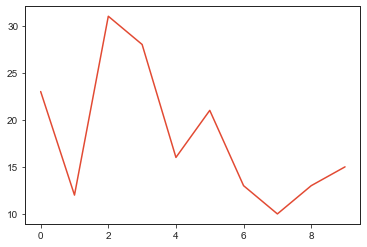

In [20]:
d = np.histogram(t_weight)
plt.plot(d[0])

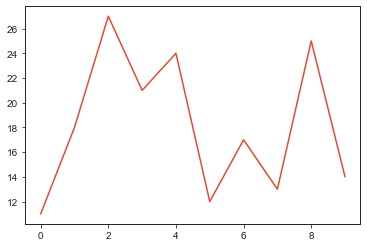

In [161]:
t = np.arange(-3,8,dif)
t_weight = []
for w in weights:
    ind = np.argmin(w[0])
    t_weight.append(t[ind])
d = np.histogram(t_weight)
plt.plot(d[0])

In [24]:
scores = outcome.get_SVM_scores_crossval(rastors,behaviors,param_grid)

0.51 accuracy with a standard deviation of 0.11
0.47 accuracy with a standard deviation of 0.16
0.55 accuracy with a standard deviation of 0.13
0.55 accuracy with a standard deviation of 0.10
0.49 accuracy with a standard deviation of 0.09
0.58 accuracy with a standard deviation of 0.09
0.58 accuracy with a standard deviation of 0.09
0.42 accuracy with a standard deviation of 0.09
0.51 accuracy with a standard deviation of 0.07
0.31 accuracy with a standard deviation of 0.09
0.40 accuracy with a standard deviation of 0.09
0.47 accuracy with a standard deviation of 0.11
0.82 accuracy with a standard deviation of 0.06
0.55 accuracy with a standard deviation of 0.13
0.44 accuracy with a standard deviation of 0.18
0.58 accuracy with a standard deviation of 0.21
0.47 accuracy with a standard deviation of 0.11
0.58 accuracy with a standard deviation of 0.14
0.60 accuracy with a standard deviation of 0.09
0.60 accuracy with a standard deviation of 0.14
0.53 accuracy with a standard deviation 

0.55 accuracy with a standard deviation of 0.10
0.53 accuracy with a standard deviation of 0.11
0.55 accuracy with a standard deviation of 0.17
0.64 accuracy with a standard deviation of 0.19


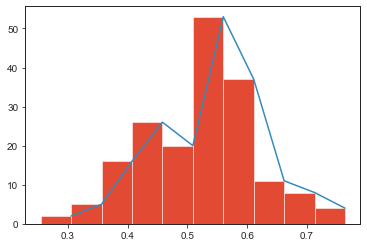

In [74]:
# 47
d = plt.hist(scores,bins=10)
plt.plot(d[1][1:],d[0])

In [162]:
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import permutation_test_score

In [163]:
from sklearn.svm import SVC
from sklearn.model_selection import permutation_test_score

In [164]:
X = rastors
y = behaviors

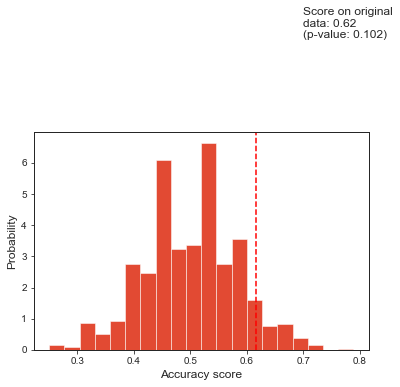

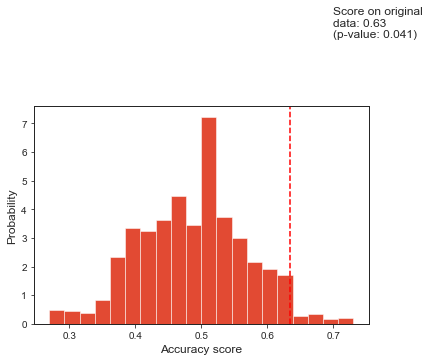

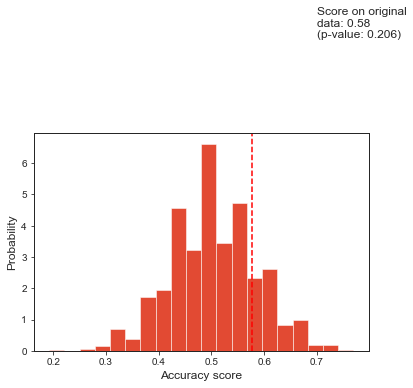

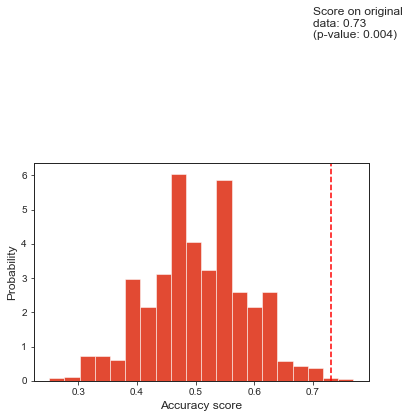

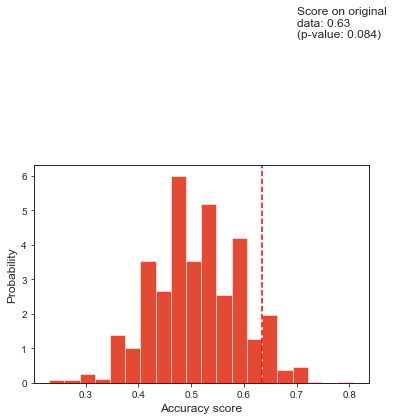

...

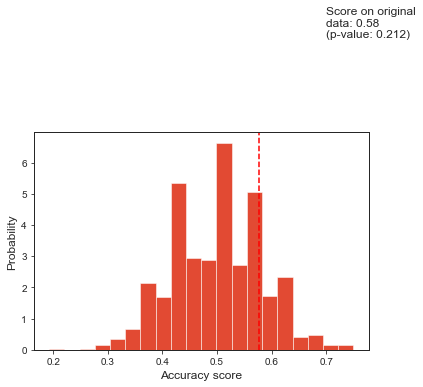

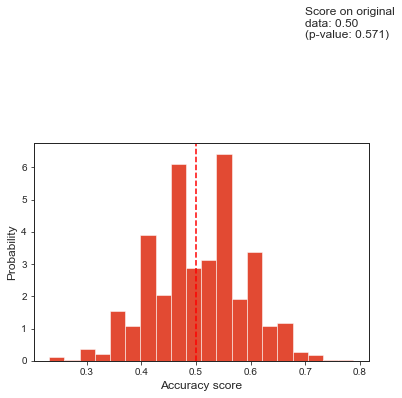

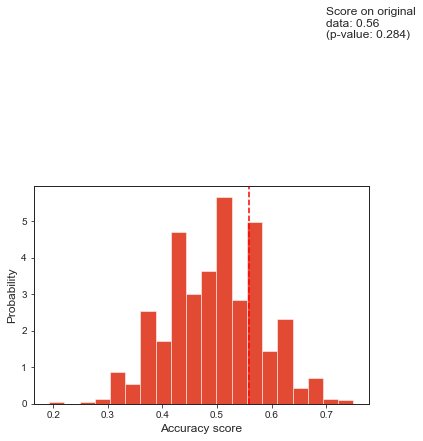

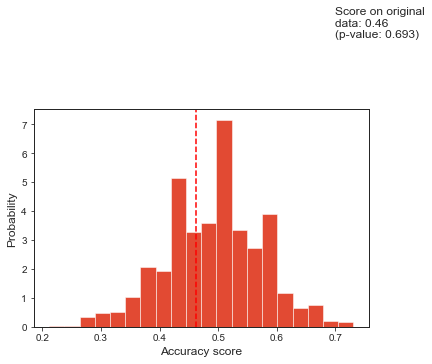

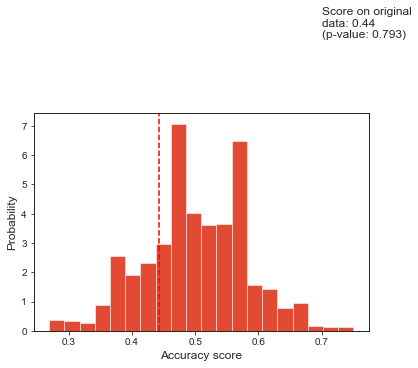

In [168]:
for i,r in enumerate(rastors):
    
    X = r
    y = behaviors[i]
    
    clf = SVC(kernel="linear", random_state=7)
    cv = StratifiedKFold(2, shuffle=True, random_state=0)

    score_iris, perm_scores_iris, pvalue_iris = permutation_test_score(
        clf, X, y, scoring="accuracy", cv=cv, n_permutations=1000
    )
    
    fig, ax = plt.subplots()

    ax.hist(perm_scores_iris, bins=20, density=True)
    ax.axvline(score_iris, ls="--", color="r")
    score_label = f"Score on original\ndata: {score_iris:.2f}\n(p-value: {pvalue_iris:.3f})"
    ax.text(0.7, 10, score_label, fontsize=12)
    ax.set_xlabel("Accuracy score")
    _ = ax.set_ylabel("Probability")
    plt.show()
    plt.close()

In [25]:
df,indicative_units,not_ind_units,prior = outcome.get_indicative_neurons(df,df_reaches,scores)

In [26]:
df_ind = df[df.indicative=='yes']


In [27]:
start = 3*30
end = 8*30
binsize = 1

In [28]:
def center(X):
    # X: ndarray, shape (n_features, n_samples)
    ss = StandardScaler(with_mean=False, with_std=True)
    Xc = ss.fit_transform(X.T).T
    return Xc

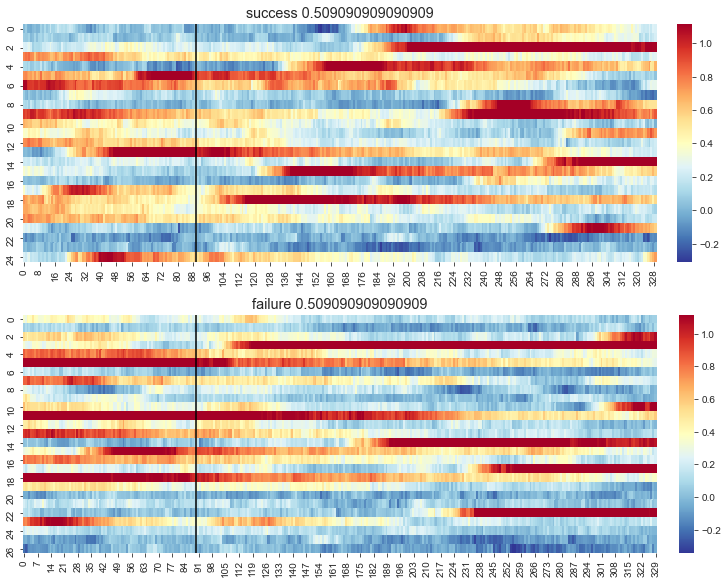

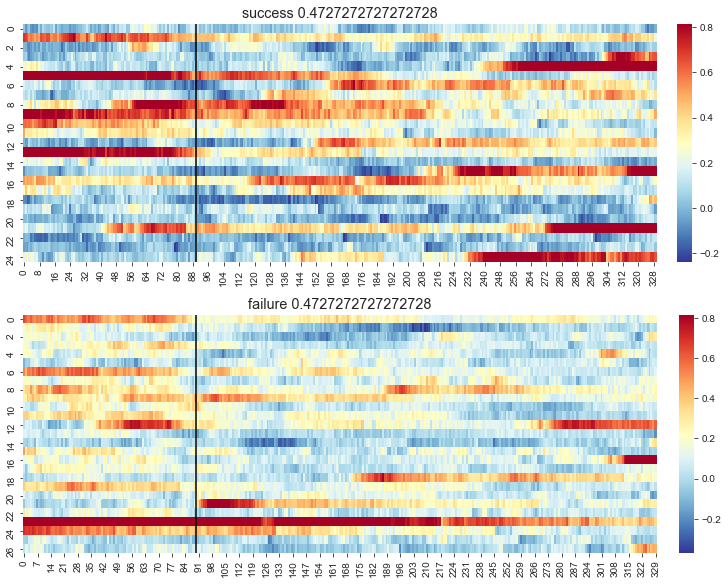

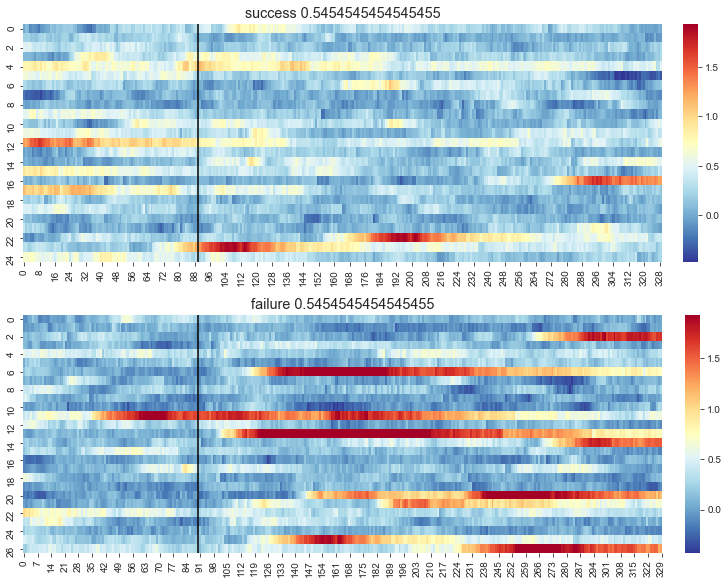

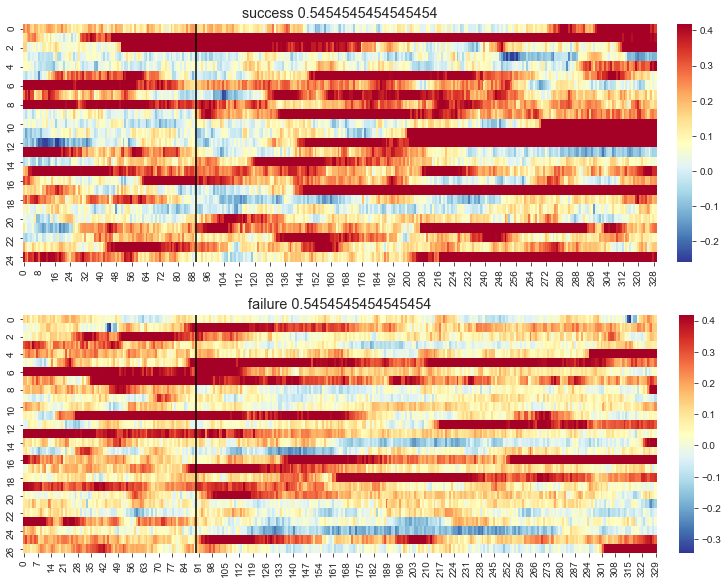

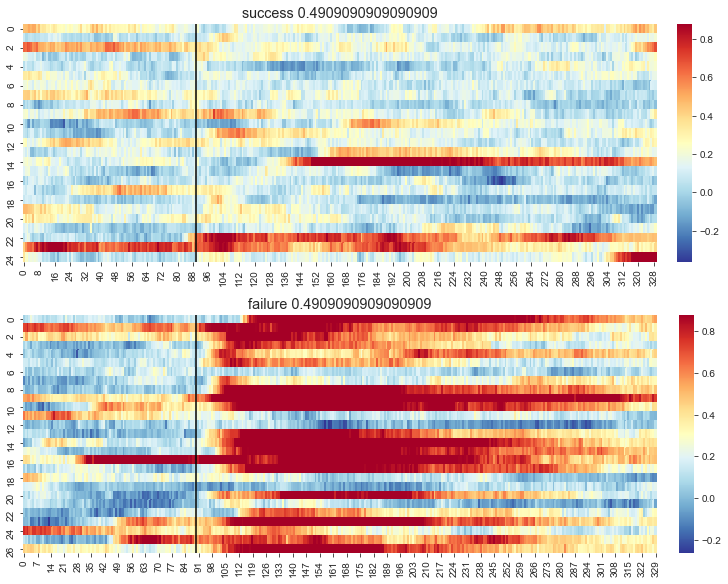

...

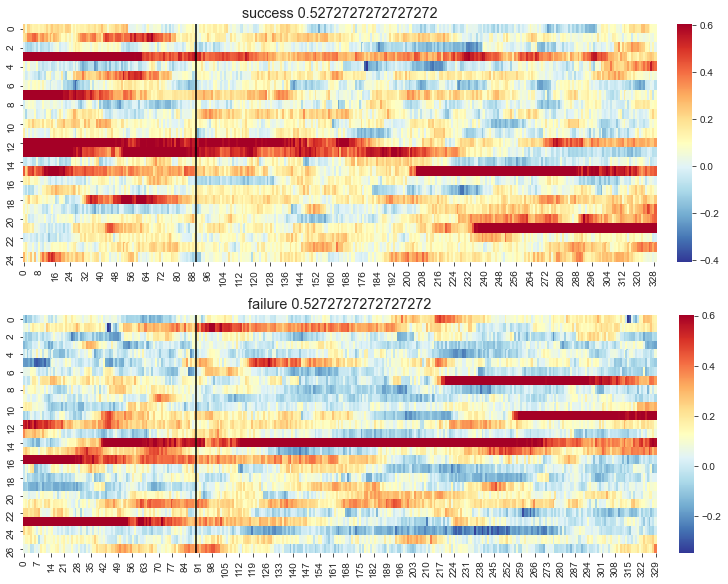

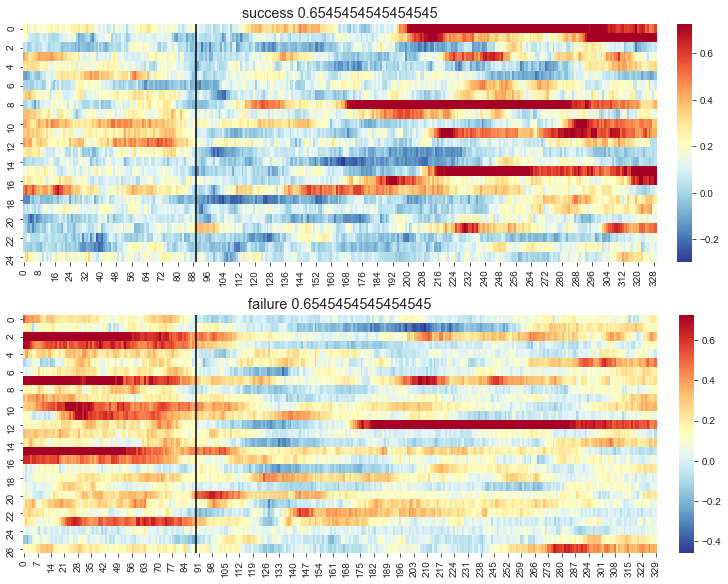

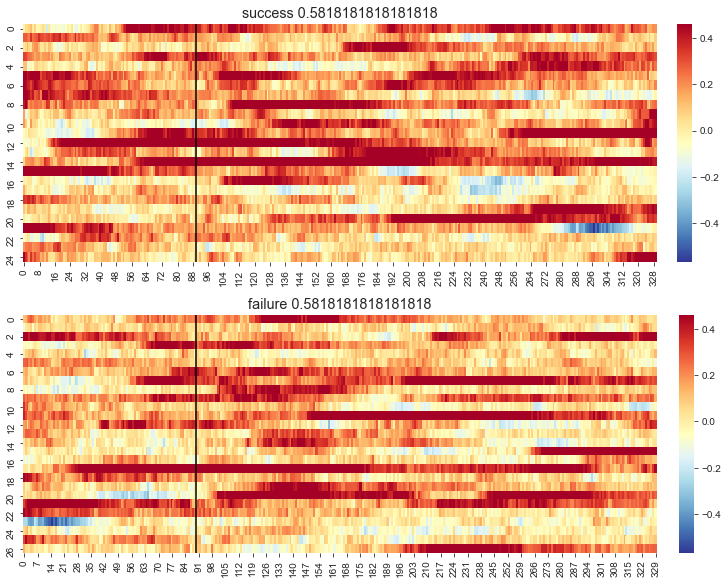

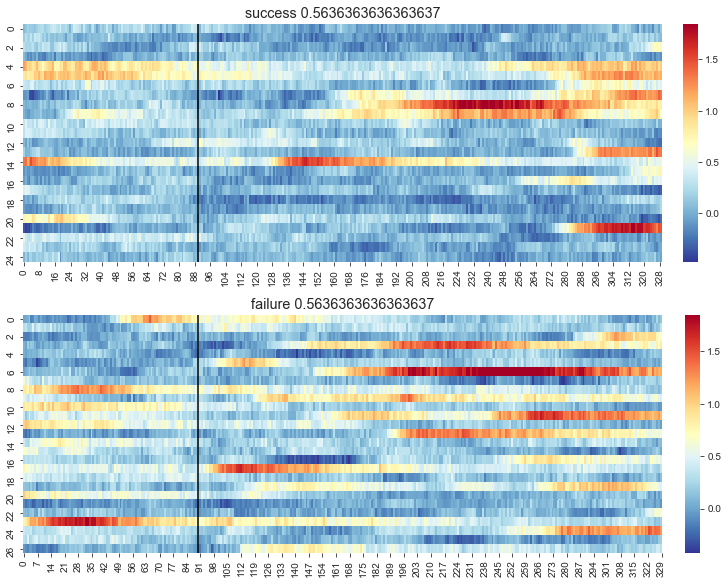

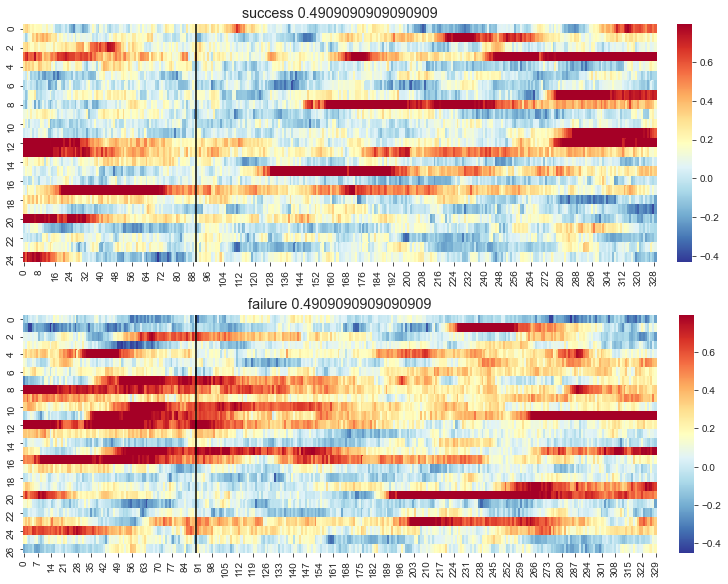

IndexError: index 25 is out of bounds for axis 0 with size 25

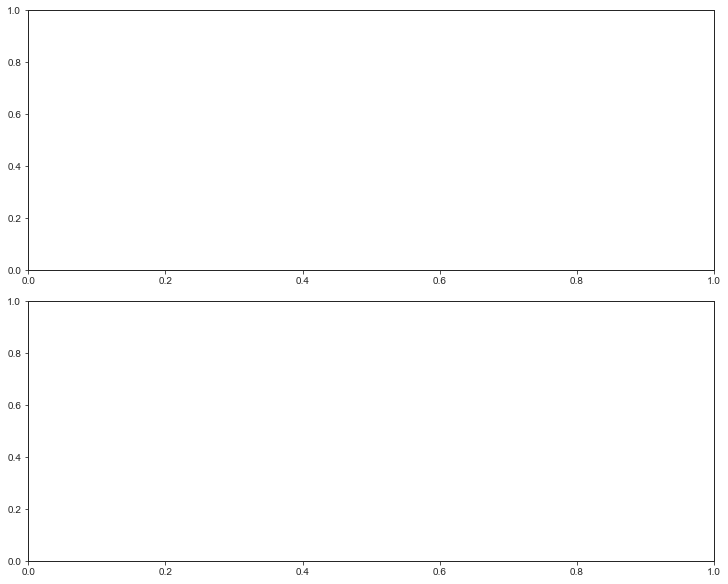

In [38]:
#path = '/Users/kimberlygagnon/Documents/CU/WelleLab/figures/xiaoyu/outcome/day10'
df_ = df_ind
dfr = df_reaches

#for j in df.mouse.unique():
#df_ = df[df.mouse==j]
#dfr = df_reaches[df_reaches.mouse==j]

rastors_f = rastor(df_,dfr[dfr.behaviors!='success'],start,end)
rastors_s = rastor(df,dfr[dfr.behaviors=='success'],start,end) 

for i,gr in enumerate(rastors_s):
    fig, (ax1,ax2) = plt.subplots(2,figsize=(10,8),constrained_layout=True)
    
    #rastor_s = center(rastors_f[i])
    #rastor_f = center(rastors_s[i])
    
    rastor_s = rastors_f[i]
    rastor_f = rastors_s[i]
    
    max1 = np.max(rastor_s[i])
    max2 = np.max(rastor_f[i])
    score = scores[i]
    vmax = np.max([max1,max2])
    #fig, (ax1,ax2) = plt.subplots(2,constrained_layout=True)
    g1 = sns.heatmap(rastor_s,vmax=vmax,cmap='RdYlBu_r',ax=ax1)
    g1.set_title('success ' + str(score))
    g1.axvline(start,c='black',ls='-')

    g2 = sns.heatmap(rastor_f,vmax=vmax,cmap='RdYlBu_r',ax=ax2)
    g2.set_title('failure '+str(score))
    g2.axvline(start,c='black',ls='-')

#        if not os.path.exists(os.path.join(path,str(j))):
#            os.makedirs(os.path.join(path,str(j)))
    #save_path = os.path.join(path,str(j))
    #print(save_path)
    plt.show()
    plt.close()
    #fig.savefig(os.path.join(save_path,str(i)))

In [35]:
np.shape(rastors_s)

(182, 27, 330)